# The 100-layer experiment of linear-relu, relu-linear, linear-relu-linear. 

In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
import math
import matplotlib.pyplot as plt 
import numpy as np
import seaborn as sns
sns.set_theme()
import pandas as pd
%matplotlib inline
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
sns.set_theme()
sns.set_context("talk", ) # paper, notebook, talk, and poster; font_scale=1.5,
from tqdm.notebook import trange, tqdm

In [22]:

def process_with_linear_ReLU(x, dim_size):
    """ Calculate: Linear(ReLU(X)), 
    where linear is init with normal distribution. 
    The function would be called 100 times to simulate an 100-layer network.

    Args:
        x (torch.FloatTensor): batch_size X dim_size
        dim_size (int): the same as the dim_size of x. 

    Returns:
        torch.FloatTensor: the computation result of Linear(ReLU(X))
    """
    linear_layer = nn.Linear(dim_size, dim_size, bias=True) 
    torch.nn.init.normal_(linear_layer.weight, std= 1/ np.sqrt(dim_size) ) 
    out = linear_layer(x)
    out = torch.nn.functional.relu(out)
    del linear_layer
    return out


def my_norm(x):
    return x/ (np.linalg.norm(x, axis=-1, keepdims=True) + 1e-16)

def feature_pair_wise_similarity(features_np, draw_figure=False):
    """Calculate the cos similarity of all posible input vector pairs, 
    and then average them. 

    Args:
        features_np (np.ndarray): Batch_size X dim_size
        draw_figure (bool, optional): Plot the distribution of the cosine similarity. Defaults to False.

    Returns:
        float: the average cos similarity of (Batch_size X Batch_size) pairs. 
    """
    normed_feature = my_norm(features_np) # Feature
    similarity = normed_feature @ normed_feature.T
    similarity = similarity.ravel().squeeze().tolist()

    x_name = 'Feature cosine pair similarity'
    tmp_df = pd.DataFrame({x_name: similarity})
    if draw_figure:
        print(tmp_df[x_name].describe())
        plt.figure()
        sns.histplot(data=tmp_df, x=x_name)
        plt.plot()
        # plt.close('all')
    return np.mean(similarity)
    

BATCH_SIZE = 1024 
DIM_SIZE   = 512 
LAYER_NUM  = 25
# Input X: random Gaussian data
input_data = torch.randn(BATCH_SIZE, DIM_SIZE, requires_grad=False) # keep data the same
            
def get_experiment_data(method_name, method_fn, repeat_times=10):
    global BATCH_SIZE, DIM_SIZE, LAYER_NUM
    results_cache = defaultdict(list)
    for exp_repeat_idx in trange(repeat_times): # repeat each experiment 10 times
        print('method:', method_name, 'repeat:', exp_repeat_idx)
        with torch.no_grad():
            
            intermediate_features = [ input_data.detach().cpu().numpy() ]
            x = input_data
            for nn_idx in range(LAYER_NUM):
                x = method_fn(x, DIM_SIZE)
                intermediate_features.append( x.detach().cpu().numpy() )

            assert len(intermediate_features) == 1 + LAYER_NUM
            for num_layers in range(LAYER_NUM+1):
                # avg_cos_similarity = feature_pair_wise_similarity(intermediate_features[num_layers], draw_figure=False) # slow
                # results_cache['avg_cos_similarity'].append(avg_cos_similarity)

                results_cache['method_name'].append(method_name)
                results_cache['num_layers'].append(num_layers)
                results_cache['exp_repeat_idx'].append('Random-{}'.format(exp_repeat_idx) )
                results_cache['intermediate_features'].append(intermediate_features[num_layers])

                
    return results_cache

    

In [24]:
exp_repeat_times = 25
results_cache = get_experiment_data(method_name='Linear+ReLU', method_fn=process_with_linear_ReLU, repeat_times=exp_repeat_times)

  0%|          | 0/25 [00:00<?, ?it/s]

method: Linear+ReLU repeat: 0
method: Linear+ReLU repeat: 1
method: Linear+ReLU repeat: 2
method: Linear+ReLU repeat: 3
method: Linear+ReLU repeat: 4
method: Linear+ReLU repeat: 5
method: Linear+ReLU repeat: 6
method: Linear+ReLU repeat: 7
method: Linear+ReLU repeat: 8
method: Linear+ReLU repeat: 9
method: Linear+ReLU repeat: 10
method: Linear+ReLU repeat: 11
method: Linear+ReLU repeat: 12
method: Linear+ReLU repeat: 13
method: Linear+ReLU repeat: 14
method: Linear+ReLU repeat: 15
method: Linear+ReLU repeat: 16
method: Linear+ReLU repeat: 17
method: Linear+ReLU repeat: 18
method: Linear+ReLU repeat: 19
method: Linear+ReLU repeat: 20
method: Linear+ReLU repeat: 21
method: Linear+ReLU repeat: 22
method: Linear+ReLU repeat: 23
method: Linear+ReLU repeat: 24


In [25]:
# Just to visualize 
dataframe = pd.DataFrame(results_cache)
dataframe

,method_name,num_layers,exp_repeat_idx,intermediate_features
0,Linear+ReLU,0,Random-0,"[[-0.7018418, -0.63954866, 0.4387068, -0.85081..."
1,Linear+ReLU,1,Random-0,"[[1.4256521, 0.0, 0.9239711, 0.0, 1.3736525, 0..."
2,Linear+ReLU,2,Random-0,"[[0.0, 0.0, 0.46265253, 1.1067709, 0.0, 0.8836..."
3,Linear+ReLU,3,Random-0,"[[0.0, 0.49965912, 0.07519281, 0.0, 0.1717681,..."
4,Linear+ReLU,4,Random-0,"[[0.18165253, 0.0, 0.24054992, 0.0, 0.5362592,..."
...,...,...,...,...
645,Linear+ReLU,21,Random-24,"[[0.0, 0.011270944, 0.06313984, 0.0, 0.0028843..."
646,Linear+ReLU,22,Random-24,"[[0.0, 0.0, 0.0, 0.0, 0.040485453, 0.007788347..."
647,Linear+ReLU,23,Random-24,"[[0.0, 0.043052513, 0.0, 0.020241585, 0.0, 0.0..."
648,Linear+ReLU,24,Random-24,"[[0.025649808, 0.0, 0.045914028, 0.0, 0.0, 0.0..."


layer_idx 1
pca.explained_variance_ratio_ [0.00272567 0.00270732 0.00267066 0.00264959 0.0026474  0.00263026]
pca.singular_values_ [6.8941593 6.8709235 6.8242373 6.797266  6.7944636 6.772427 ]


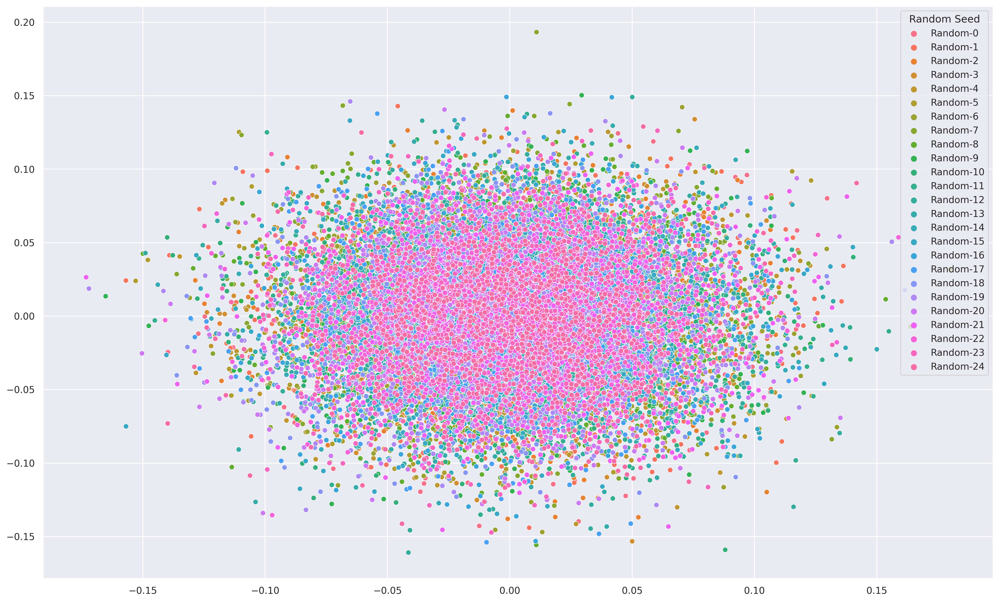

layer_idx 5
pca.explained_variance_ratio_ [0.03593124 0.03421784 0.03333546 0.03226537 0.03184809 0.03027233]
pca.singular_values_ [24.736683 24.13969  23.826408 23.440866 23.288797 22.705355]


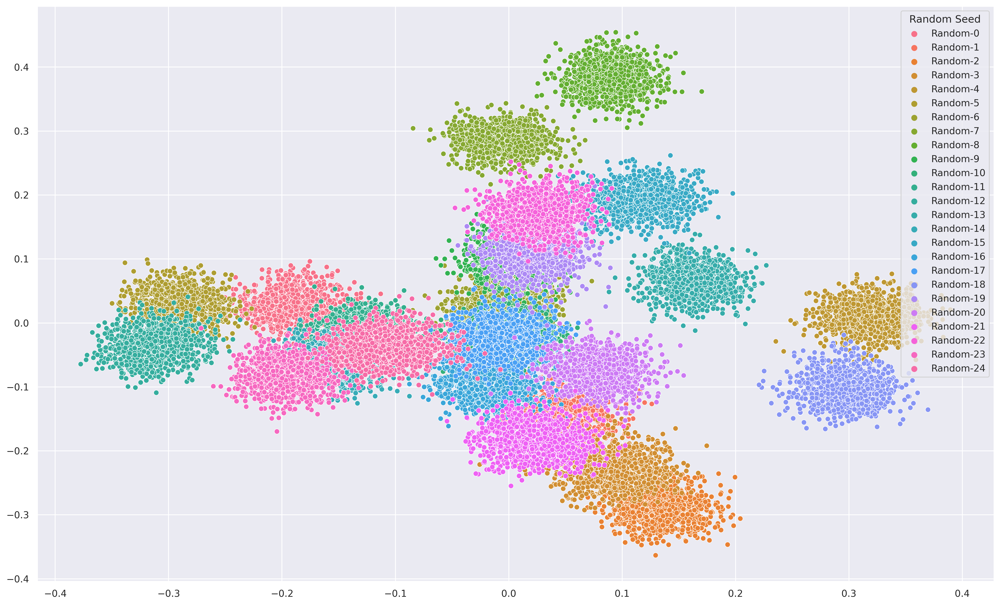

layer_idx 10
pca.explained_variance_ratio_ [0.05214915 0.05003275 0.04693755 0.04580389 0.04466124 0.04306084]
pca.singular_values_ [29.640667 29.032974 28.120598 27.77893  27.430244 26.934294]


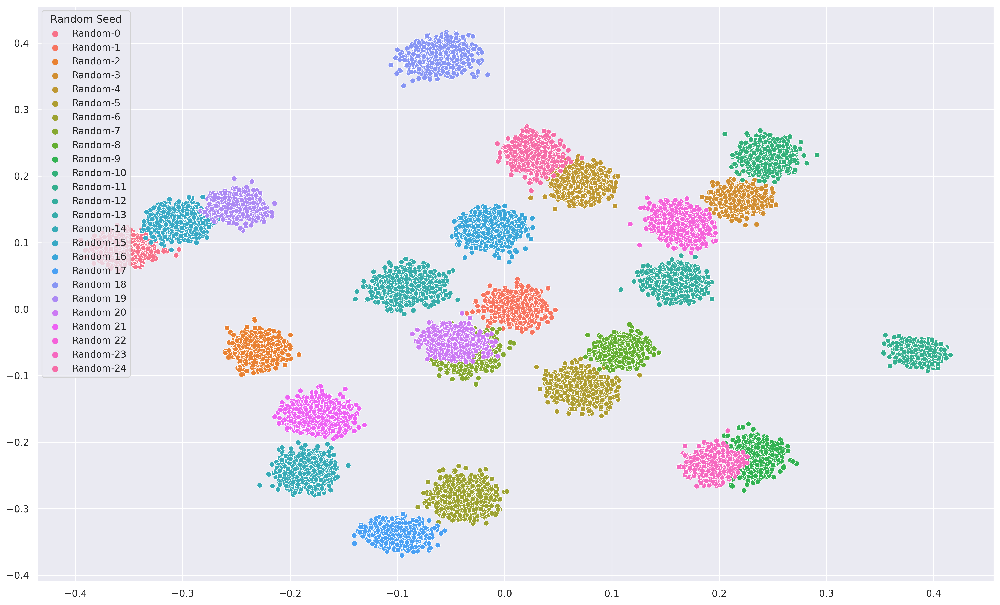

layer_idx 20
pca.explained_variance_ratio_ [0.06076998 0.057554   0.05389516 0.05231937 0.0504956  0.04970375]
pca.singular_values_ [31.7072   30.856817 29.859894 29.420132 28.902815 28.675299]


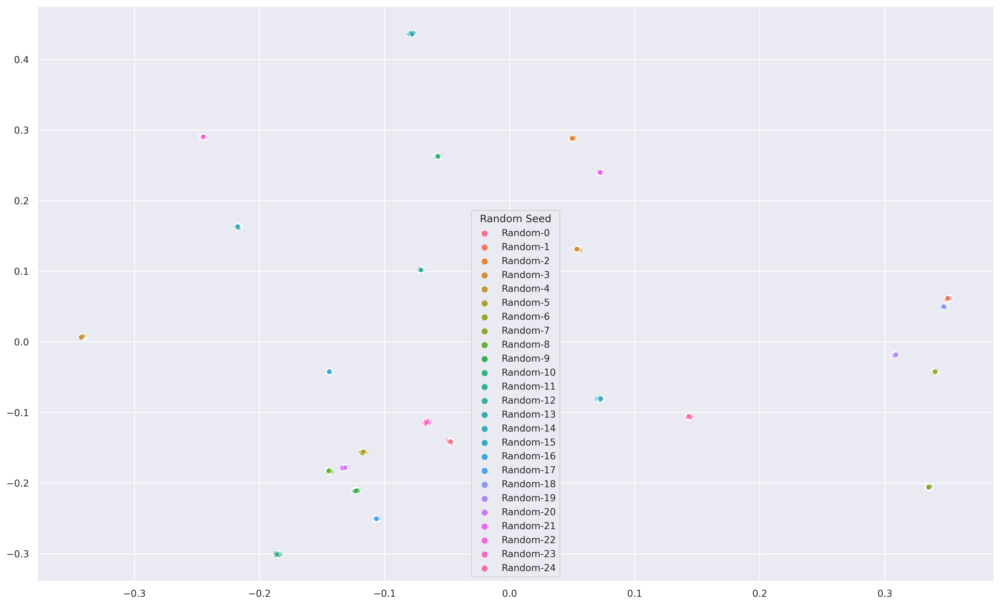

In [28]:
# Plot
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# sns.set(font_scale=2)  # crazy big
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
sns.set_theme()



for layer_idx in [1, 5, 10, 20]:
    total_feature_list = list()
    label_list = list()
    
    for record_idx in range(exp_repeat_times * (LAYER_NUM+1) ):
        if results_cache['num_layers'][record_idx] == layer_idx:
            total_feature_list.append(results_cache['intermediate_features'][record_idx])
            label_list.extend([results_cache['exp_repeat_idx'][record_idx]] * BATCH_SIZE)


    total_feature_np = np.concatenate(total_feature_list, axis=0) 
    total_feature_np = my_norm(total_feature_np) # L2-normalize

    pca = PCA(n_components=6)
    pca_result = pca.fit_transform(total_feature_np)

    df = pd.DataFrame()
    df['pca_one'] = pca_result[:,0]
    df['pca_two'] = pca_result[:,1] 
    df['Random Seed'] = label_list

    if True:
        print('layer_idx', layer_idx)
        print('pca.explained_variance_ratio_', pca.explained_variance_ratio_)
        print('pca.singular_values_', pca.singular_values_)

        plt.figure(figsize=(20.0,6.18 * 2))
        p1 = sns.scatterplot(
            x="pca_one", y="pca_two",
            hue="Random Seed",
            data=df,
            legend=True,
        )
        plt.xlabel("")
        plt.ylabel("")
        # plt.legend(title='Random Seed', loc='upper left', bbox_to_anchor=(1.00, 1.0, ), prop={'size': 18})
        plt.show()
